In [2]:
from datautils import *
from vae import *

# Model Training and Latent Extraction

In [ ]:
RS_csv_path = "RS_example.csv"

### Dataset Generation for Later Use In Generating Latents both for Control and PTSD Trained Models

In [ ]:
# Dataset with both control and PTSD subjects for generating latents 
# after training
both_RS_dataset = generate_datasets(RS_csv_path, dataset_type='RS', non_data_cols=non_data_cols, patient_type='control_ptsd', randomize=False, scale_features='robust')
trans = transforms.Compose([GaussianNoise(0, 0.1, both_RS_dataset.brain_columns), ToTorchFormat()])
both_RS_dataset.transform = trans

### Dataset Generation For Training On Control

In [152]:
# Train test split
tt_split = 0.8
# Amt of training data to set aside for validation
val_split = 0.2

# RS

non_data_cols = ['Age', 'Sex']

# For loading the control resting state dataset
train_control_RS_dataset, val_control_RS_dataset, test_control_RS_dataset = \
generate_datasets(RS_csv_path, dataset_type='RS', non_data_cols=non_data_cols, 
                  patient_type='control', train_test_split=True, 
                  percent_split=tt_split, validation_split=val_split, 
                  randomize=True, scale_features='robust')


# Transforms need to be applied after the dataset is generated since GaussianNoise requires the brain_columns of the dataset
trans = transforms.Compose([GaussianNoise(0, 0.1, train_control_RS_dataset.brain_columns), ToTorchFormat()])
train_control_RS_dataset.transform = trans
val_control_RS_dataset.transform = trans
test_control_RS_dataset.transform = trans

# For loading the PTSD RS dataset for training validation
PTSD_RS_dataset = generate_datasets(RS_csv_path, dataset_type='RS', non_data_cols=non_data_cols, patient_type='PTSD', 
                                    randomize=True, scale_features='robust')
# Transforms need to be applied after the dataset is generated since GaussianNoise requires the brain_columns of the dataset
trans = transforms.Compose([GaussianNoise(0, 0.1, PTSD_RS_dataset.brain_columns), ToTorchFormat()])
PTSD_RS_dataset.transform = trans

C:\Users\Orren\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3418: DtypeWarning: Columns (1) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)
C:\Users\Orren\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3418: DtypeWarning: Columns (1) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [160]:
train_dataset = train_control_RS_dataset
val_dataset = val_control_RS_dataset
test_dataset = test_control_RS_dataset

### Training Model on Control and Extracting Latents

In [157]:
hidden_sizes = [400]
latent_sizes = [10]
betas = [1]
l2s = [0.1]
learning_rates = [1e-3]

activations = ('tanh', 'selu', 'tanh', 'tanh')

epochs = 500

for hidden_size in hidden_sizes:
    for latent_size in latent_sizes:
        for beta in betas:
            for l2 in l2s:
                for learning_rate in learning_rates:
                    # This is simply our naming convention as it easily facilitates multiple iterations and
                    # varying parameters
                    net_name = 'control_{}_l{}_h{}_b{}'.format('RS', latent_size, hidden_size, beta)

                    stats_list = ["epoch", "loss", "loss_per_feature", "validation_loss", "validation_loss_per_feature"]
                    
                    # Will train the net for the given epochs, save the loss each epoch, and validation will be performed
                    # on specified datasets in the validation parameter.
                    train_net(net_name, train_dataset, num_epochs=epochs, until=epochs, 
                              hidden_size=hidden_size, latent_size=latent_size, 
                              activations=activations, beta=beta, l2=l2, learning_rate=learning_rate,
                              load_net=False, overwrite=True, overwrite_log=True, stats_list=stats_list, 
                              validation=[val_dataset, PTSD_RS_dataset])

                    # Post training validation on test dataset and PTSD dataset
                    validation(net_name, test_dataset, overwrite_log=True) 
                    validation(net_name, PTSD_RS_dataset)

                    extract_latents(net_name, both_RS_dataset, fname_tag='both')

C:\Users\Orren\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3418: DtypeWarning: Columns (1) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


Successfully loaded model C:\Users\Orren\Documents\Columbia\code\vae_nets\control_RS_l10_h400_b1\control_RS_l10_h400_b1_449.nn.
Extracting latents...
[0/2311 (0%)]
[64/2311 (3%)]
[128/2311 (5%)]
[192/2311 (8%)]
[256/2311 (11%)]
[320/2311 (14%)]
[384/2311 (16%)]
[448/2311 (19%)]
[512/2311 (22%)]
[576/2311 (24%)]
[640/2311 (27%)]
[704/2311 (30%)]
[768/2311 (32%)]
[832/2311 (35%)]
[896/2311 (38%)]
[960/2311 (41%)]
[1024/2311 (43%)]
[1088/2311 (46%)]
[1152/2311 (49%)]
[1216/2311 (51%)]
[1280/2311 (54%)]
[1344/2311 (57%)]
[1408/2311 (59%)]
[1472/2311 (62%)]
[1536/2311 (65%)]
[1600/2311 (68%)]
[1664/2311 (70%)]
[1728/2311 (73%)]
[1792/2311 (76%)]
[1856/2311 (78%)]
[1920/2311 (81%)]
[1984/2311 (84%)]
[2048/2311 (86%)]
[2112/2311 (89%)]
[2176/2311 (92%)]
[2240/2311 (95%)]
[252/2311 (97%)]
done.
Saving latents to  C:\Users\Orren\Documents\Columbia\code\vae_nets\control_RS_l10_h400_b1\control_RS_l10_h400_b1_both_latents.csv


,Site,SubjectID,Site,SubjectID,Diagnosis,Age,Sex,mu_0,mu_1,mu_2,...,logvar_0,logvar_1,logvar_2,logvar_3,logvar_4,logvar_5,logvar_6,logvar_7,logvar_8,logvar_9
0,AMC,1132,AMC,1132,0,29,0.0,9.797742,11.998566,2.944736,...,-1.709953,-1.757961,-1.757910,-1.757548,-1.757875,-1.756908,-1.757995,-1.757817,-1.756924,-1.758021
1,AMC,1133,AMC,1133,0,57,0.0,0.481782,-1.485800,1.529423,...,1.241523,-1.013583,-0.239021,-0.329504,-0.611026,-1.026272,-0.986236,-0.235720,-1.423576,-1.461293
2,AMC,1134,AMC,1134,0,28,0.0,-0.016038,2.358806,-1.037384,...,-1.533443,-0.314569,-0.939080,-0.776994,-0.591046,0.353891,-0.138881,-0.773015,0.997803,1.011178
3,AMC,1135,AMC,1135,0,37,0.0,12.611667,5.925333,6.674385,...,-1.606845,-1.752708,-1.752505,-1.742913,-1.753601,-1.742842,-1.753570,-1.749785,-1.735510,-1.755382
4,AMC,1136,AMC,1136,0,45,0.0,-1.757906,1.436291,-1.692912,...,-1.148506,-1.603193,-1.597942,-1.556781,-1.537855,-1.468314,-1.613186,-1.512422,-1.425904,-1.553705
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2306,Wisc_Grupe,893,Wisc_Grupe,893,0,32,0.0,0.481782,-1.485800,1.529423,...,1.241523,-1.013583,-0.239021,-0.329504,-0.611026,-1.026272,-0.986236,-0.235720,-1.423576,-1.461293
2307,Wisc_Grupe,894,Wisc_Grupe,894,0,25,0.0,-0.016038,2.358806,-1.037384,...,-1.533443,-0.314569,-0.939080,-0.776994,-0.591046,0.353891,-0.138881,-0.773015,0.997803,1.011178
2308,Wisc_Grupe,895,Wisc_Grupe,895,0,26,0.0,0.481782,-1.485800,1.529423,...,1.241523,-1.013583,-0.239021,-0.329504,-0.611026,-1.026272,-0.986236,-0.235720,-1.423576,-1.461293
2309,Wisc_Grupe,896,Wisc_Grupe,896,0,32,0.0,-0.016038,2.358806,-1.037384,...,-1.533443,-0.314569,-0.939080,-0.776994,-0.591046,0.353891,-0.138881,-0.773015,0.997803,1.011178


# Analysis of Loss Function

In [ ]:
import matplotlib.pyplot as plt
from plottingutils import *

In [34]:
SMALL_SIZE = 16
MEDIUM_SIZE = 20
BIGGER_SIZE = 24

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

## RS Loss

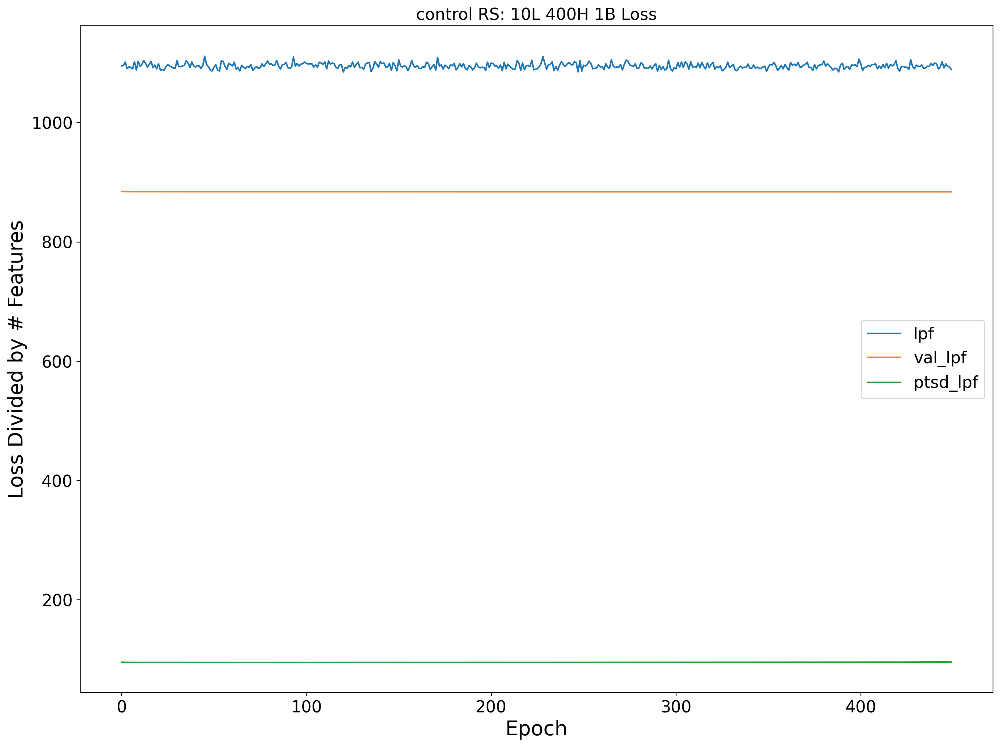

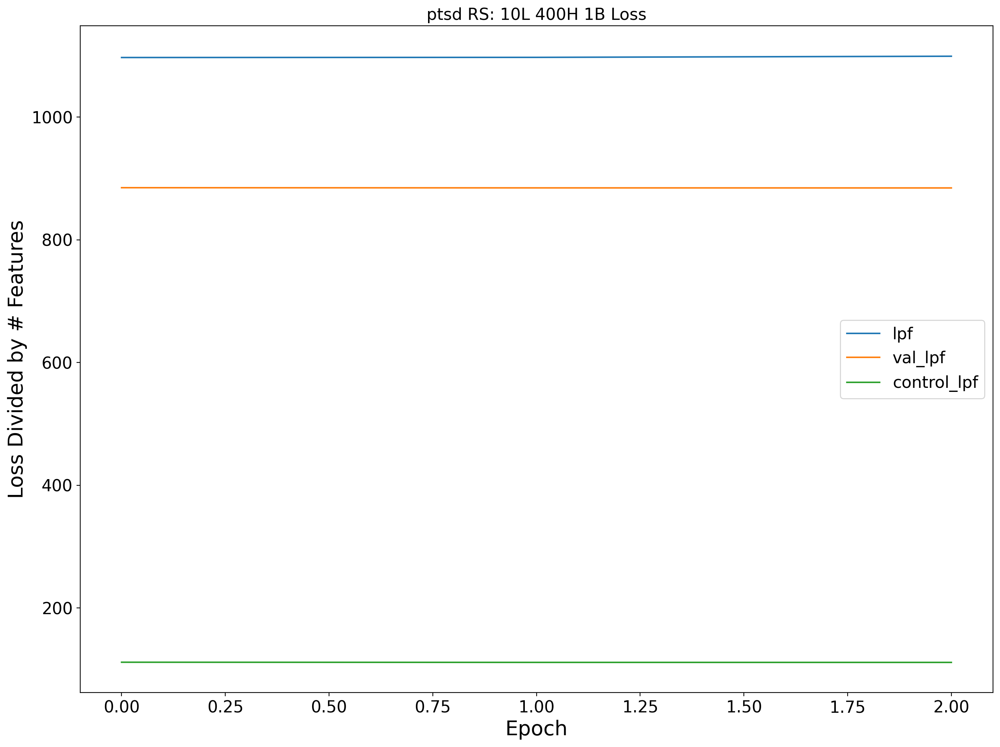

In [148]:
type_list = ["RS"]
latent_nums = [10]
hidden_nums = [400]
betas = [1]
for type_name in type_list:
    for latent_num in latent_nums:
        for hidden_num in hidden_nums:
            for beta in betas:
                # Need to make sure that the net name matches the name of the net you trained
                # This is simply our naming convention as it easily facilitates multiple iterations and
                # varying parameters
                net_name = "control_{}_l{}_h{}_b{}".format(type_name, latent_num, hidden_num, beta)
                plot_title = "{} {}: {}L {}H {}B Loss".format(diag, type_name, latent_num, hidden_num, beta)
                diag_label = [x for x in diag_list if x != diag][0]
                stat_label_dict = {'loss_per_feature' : 'lpf', 
                                   'validation_loss_per_feature' : ['val_lpf', "{}_lpf".format(diag_label)]}
                save_name = "{}_{}L_{}H_{}B_loss.png".format(type_name, latent_num, hidden_num, beta)
                plot_loss(net_name, plot_title, stat_label_dict, save_name)

## Plotting Individual Latents for RS Example

Reading latents from  C:\Users\Orren\Documents\Columbia\code\vae_nets\control_RS_l10_h400_b1\control_RS_l10_h400_b1_both_latents.csv


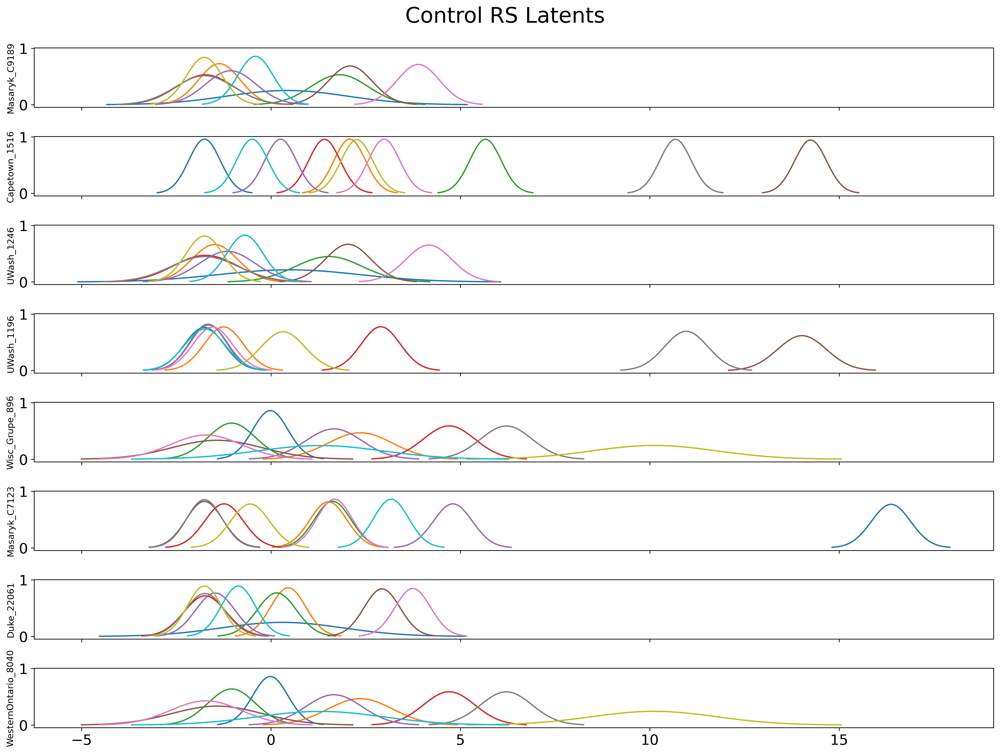

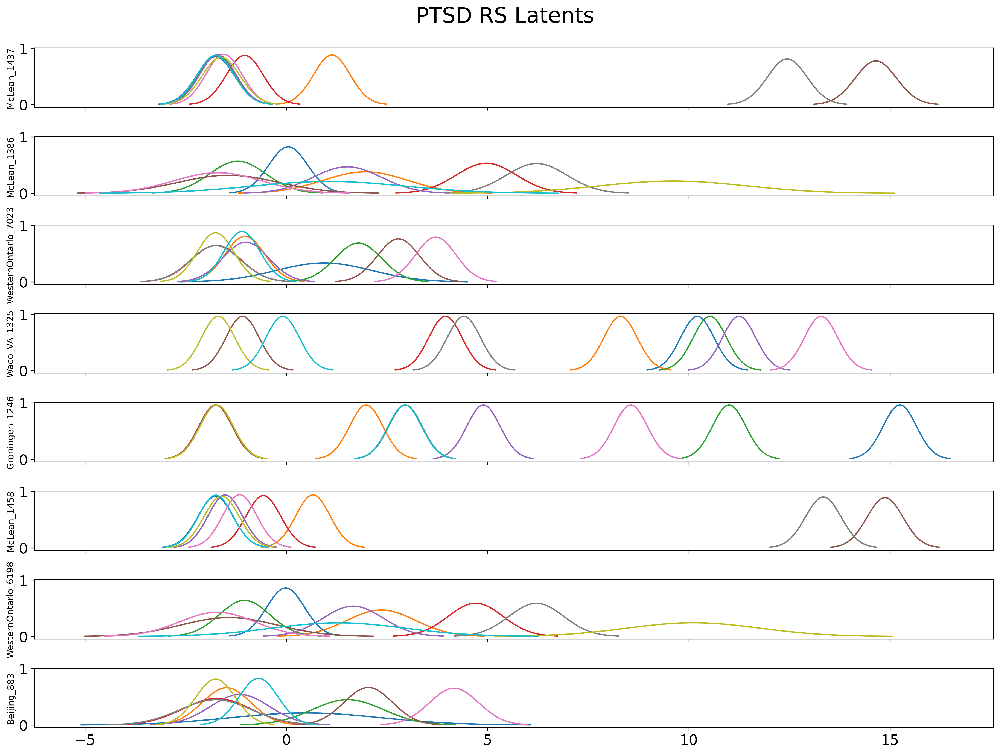

Reading latents from  C:\Users\Orren\Documents\Columbia\code\vae_nets\control_RS_l10_h400_b1\control_RS_l10_h400_b1_both_latents.csv


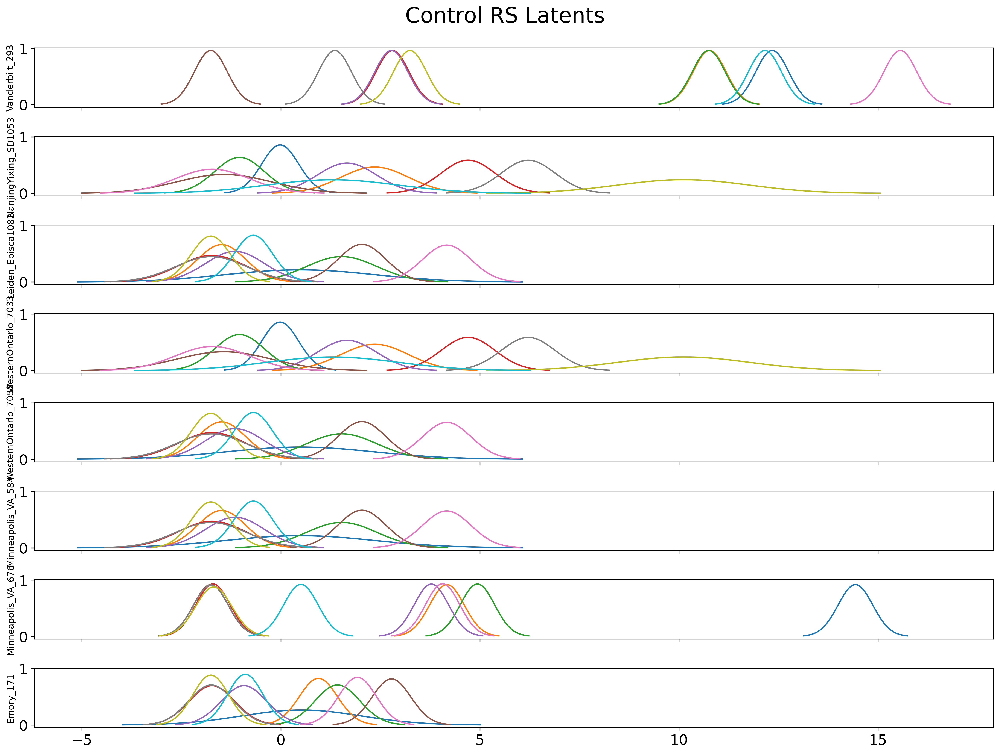

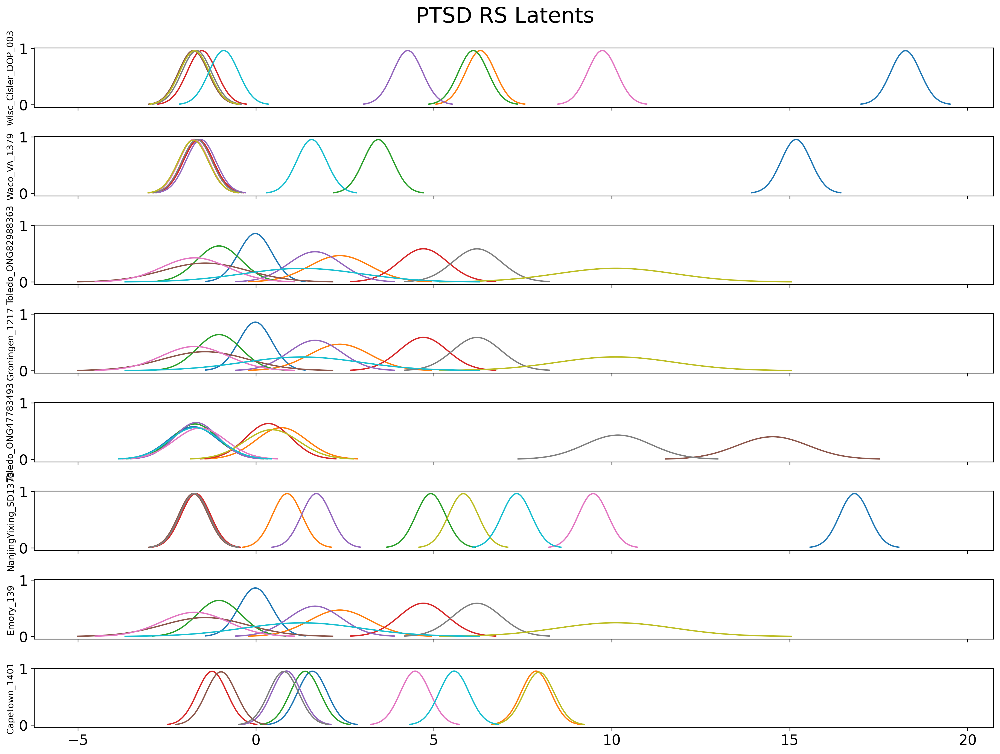

Reading latents from  C:\Users\Orren\Documents\Columbia\code\vae_nets\control_RS_l10_h400_b1\control_RS_l10_h400_b1_both_latents.csv


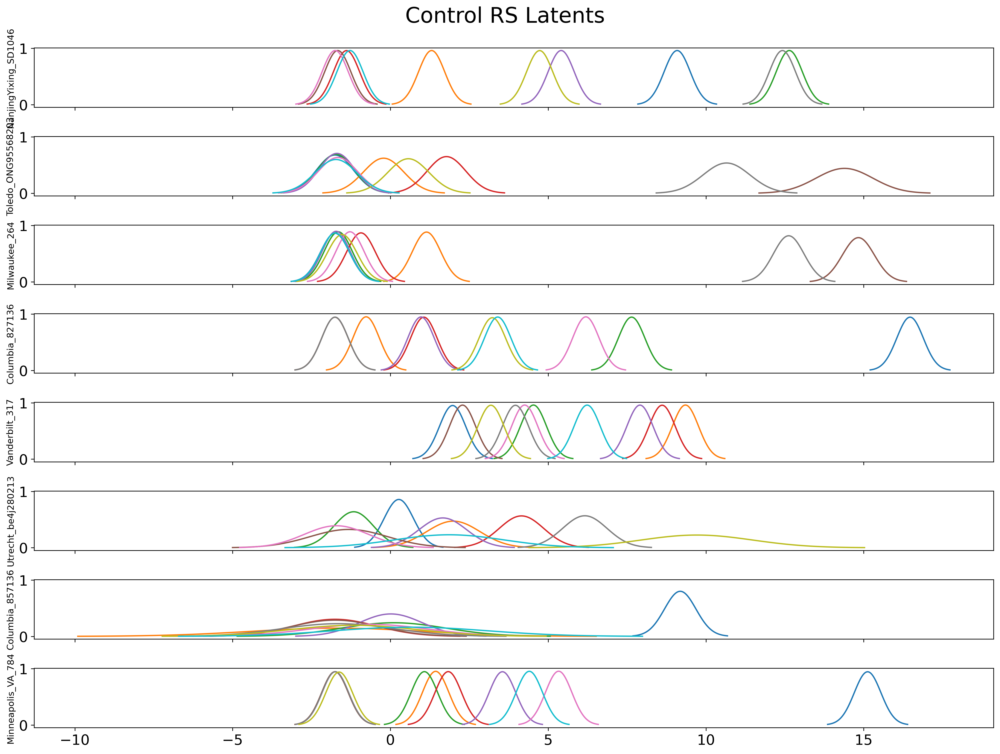

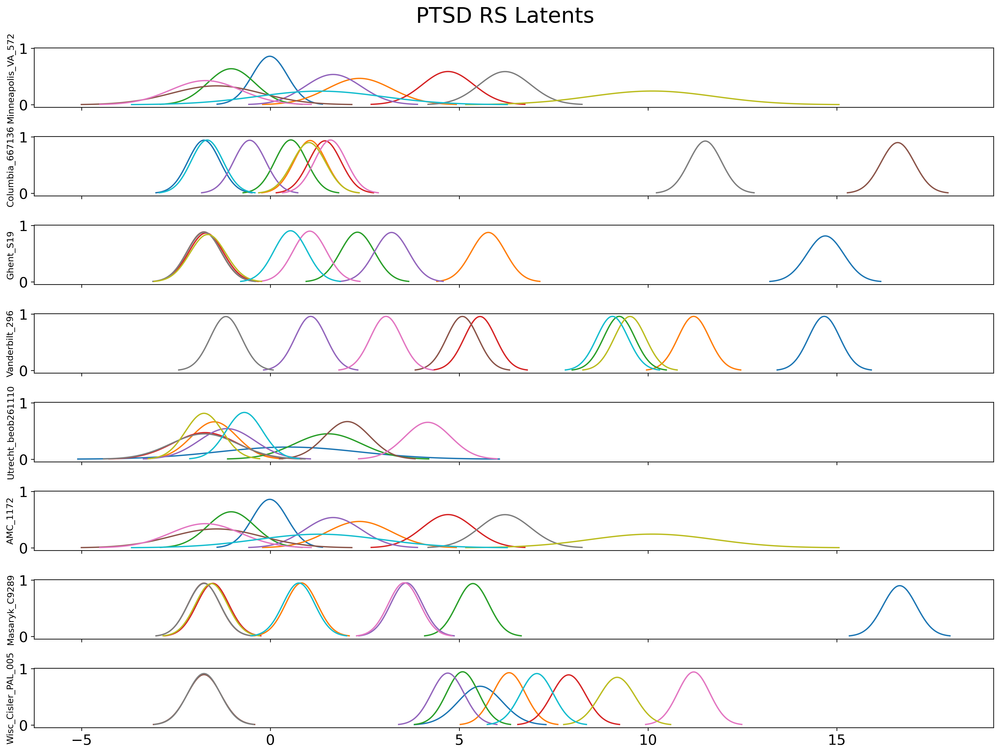

In [161]:
diagnoses = ['Control', 'PTSD']
type_list = ["RS"]
latent_nums = [10]
hidden_nums = [400]
betas = [1]

for type_name in type_list:
    for latent_num in latent_nums:
        for hidden_num in hidden_nums:
            for beta in betas:
                # Need to make sure that the net name matches the name of the net you trained
                # This is simply my naming convention as it easily facilitates multiple iterations and
                # varying parameters
                net_name = "control_{}_l{}_h{}_b{}".format(type_name, latent_num, hidden_num, beta)
                for run in range(3):
                    df = load_latents(net_name, fname_tag='both')
                    for diagnosis in diagnoses:
                        plot_latent_individual(df, type_name='RS', n_choices=8, diagnosis=diagnosis, sharex=True, 
                                               sharey=True, run_id=run)

## Plotting Average Latents Over Site RS Example

Reading latents from  C:\Users\Orren\Documents\Columbia\code\vae_nets\control_RS_l10_h400_b1\control_RS_l10_h400_b1_both_latents.csv


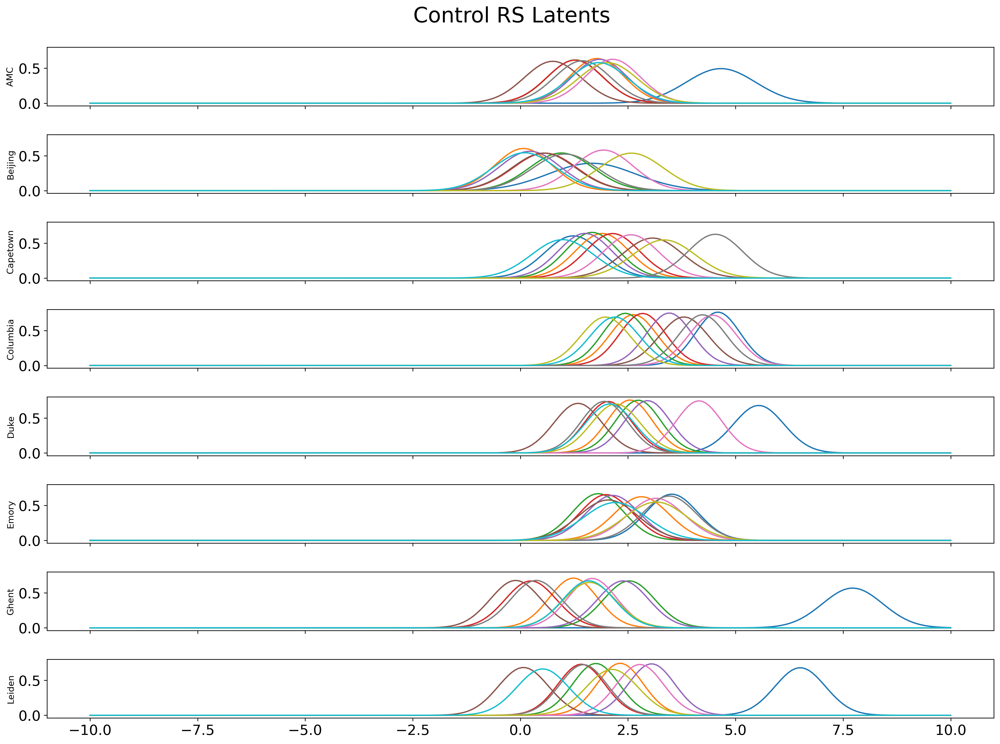

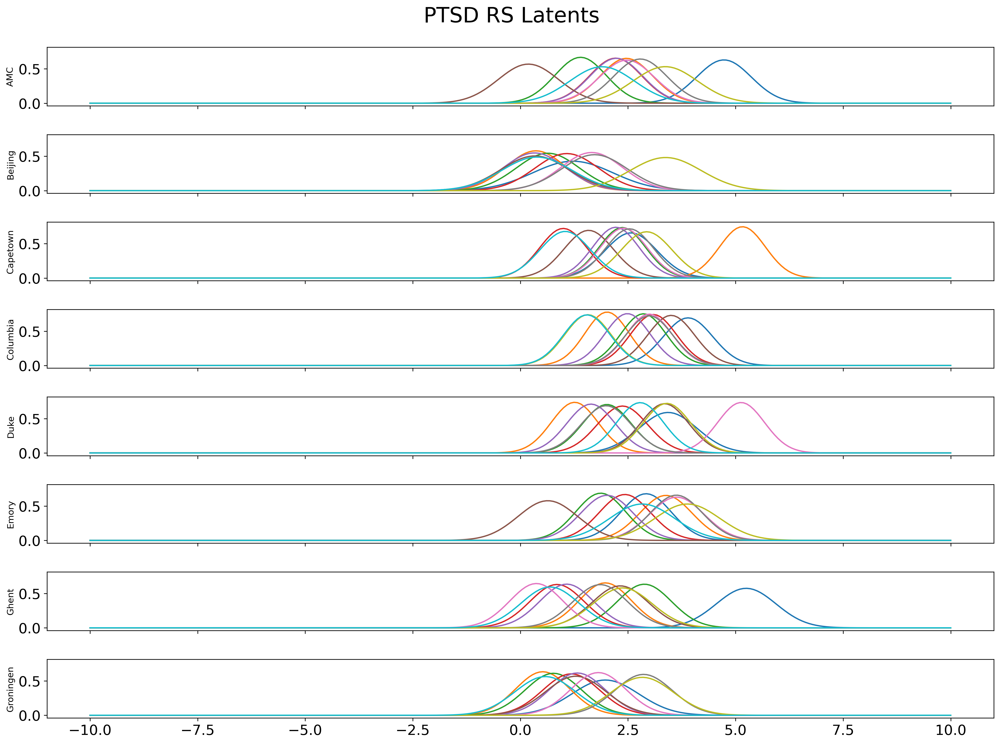

Reading latents from  C:\Users\Orren\Documents\Columbia\code\vae_nets\control_RS_l10_h400_b1\control_RS_l10_h400_b1_both_latents.csv


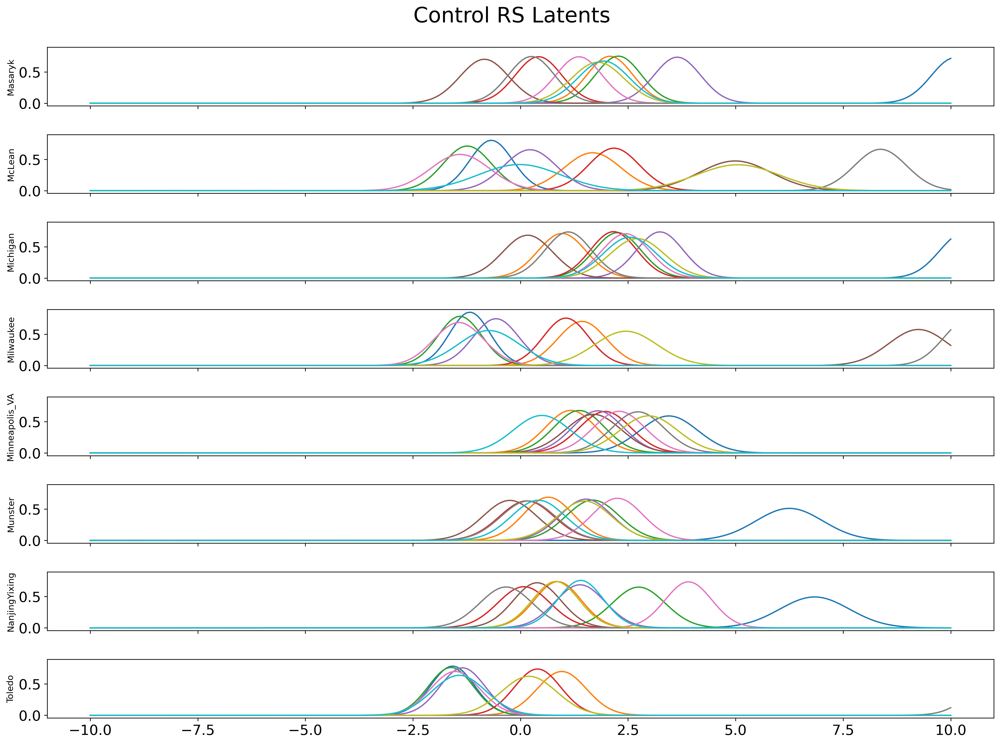

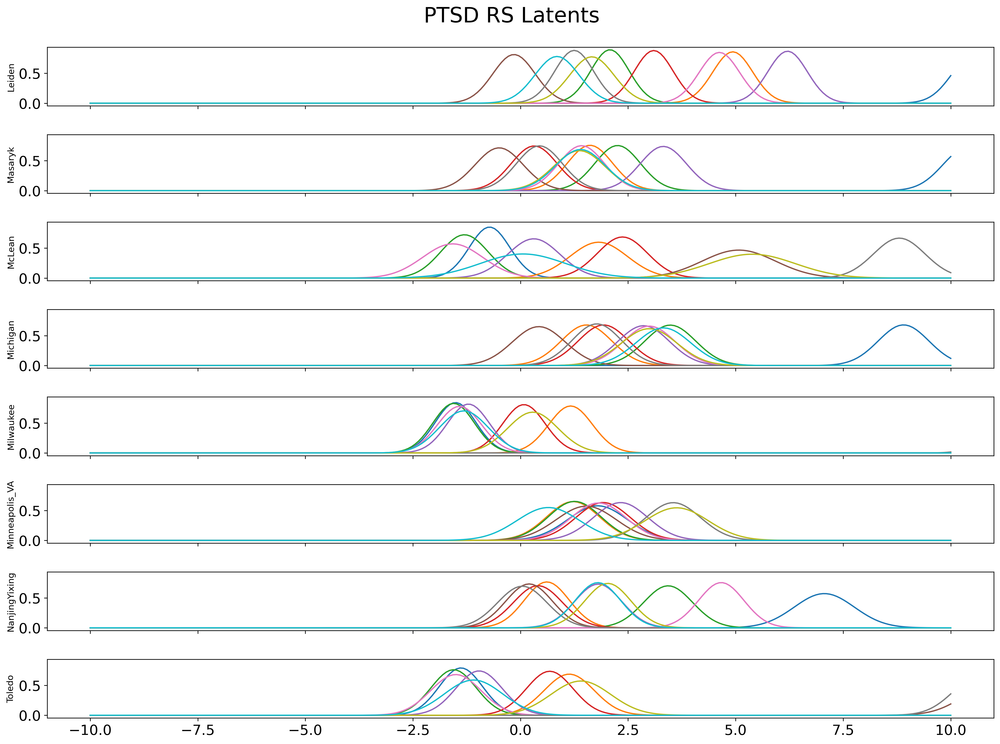

Reading latents from  C:\Users\Orren\Documents\Columbia\code\vae_nets\control_RS_l10_h400_b1\control_RS_l10_h400_b1_both_latents.csv


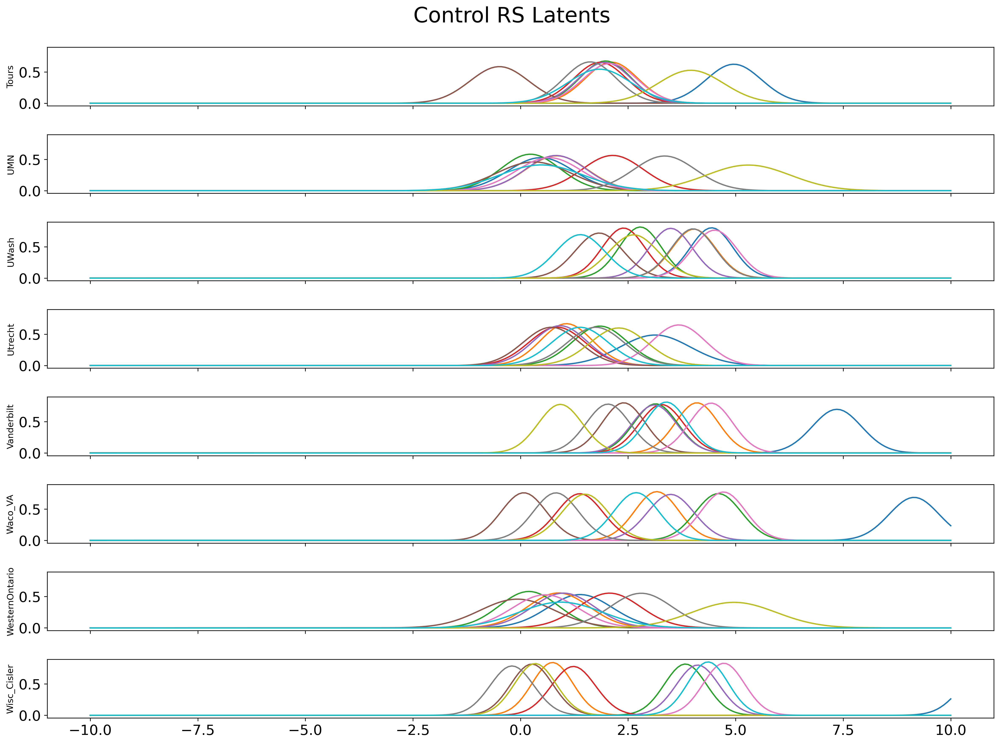

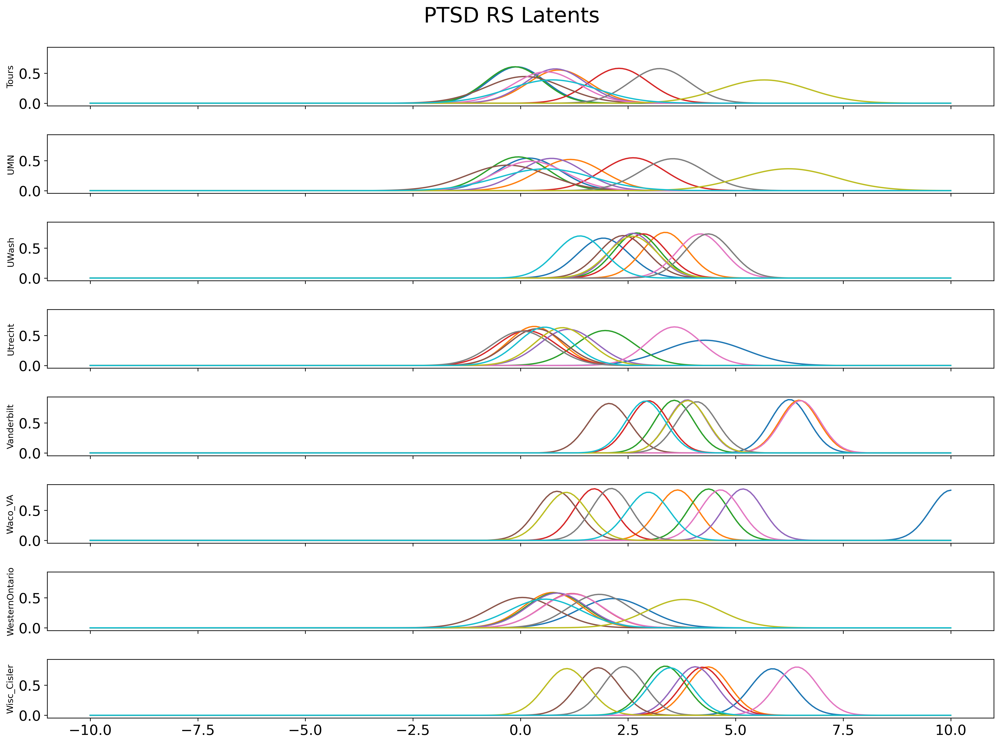

In [163]:
diagnoses = ['Control', 'PTSD']

avg_col = 'Site'

type_list = ["RS"]
latent_nums = [10]
hidden_nums = [400]
betas = [1]
num_runs = 3
for type_name in type_list:
    for latent_num in latent_nums:
        for hidden_num in hidden_nums:
            for beta in betas:
                # Need to make sure that the net name matches the name of the net you trained
                # This is simply our naming convention as it easily facilitates multiple iterations and
                # varying parameters
                net_name = "control_{}_l{}_h{}_b{}".format(type_name, latent_num, hidden_num, beta)
                for run in range(num_runs):
                    df = load_latents(net_name, fname_tag='both')
                    for i, diagnosis in enumerate(diagnoses):
                        site_len = len(df[df['Diagnosis'] == i]['Site'].unique()) - 1
                        choices = list(range(site_len))
                        if run != num_runs - 1:
                            choices = choices[site_len//num_runs*run : site_len//num_runs*(run+1)]
                        else:
                            choices = choices[site_len//num_runs*run :]
                        plot_latent_average(df, type_name='RS', choices=choices, diagnosis=diagnosis, avg_col=avg_col, sharex=True, sharey=True, run_id=run)